In [5]:
%pip install pandas
import pandas as pd

C:\Users\Aditi\AppData\Local\Temp\ipykernel_17412\2250148063.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [6]:
data = pd.read_csv("./cic-ids.csv")

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4529990 entries, 0 to 4529989
Data columns (total 37 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Dst Port           int64  
 1   Protocol           int64  
 2   Bwd Pkt Len Min    int64  
 3   Flow Byts/s        float64
 4   Fwd IAT Tot        int64  
 5   Fwd IAT Mean       float64
 6   Fwd IAT Min        int64  
 7   Bwd IAT Tot        int64  
 8   Bwd IAT Std        float64
 9   Bwd IAT Max        int64  
 10  Bwd IAT Min        int64  
 11  Fwd PSH Flags      int64  
 12  Fwd URG Flags      int64  
 13  Fwd Pkts/s         float64
 14  Bwd Pkts/s         float64
 15  Pkt Len Min        int64  
 16  Pkt Len Std        float64
 17  Pkt Len Var        float64
 18  FIN Flag Cnt       int64  
 19  PSH Flag Cnt       int64  
 20  ACK Flag Cnt       int64  
 21  URG Flag Cnt       int64  
 22  ECE Flag Cnt       int64  
 23  Down/Up Ratio      int64  
 24  Fwd Seg Size Avg   float64
 25  Bwd Seg Size Avg  

In [8]:
feature_list = data.columns.values.tolist()

In [9]:
feature_list

['Dst Port',
 'Protocol',
 'Bwd Pkt Len Min',
 'Flow Byts/s',
 'Fwd IAT Tot',
 'Fwd IAT Mean',
 'Fwd IAT Min',
 'Bwd IAT Tot',
 'Bwd IAT Std',
 'Bwd IAT Max',
 'Bwd IAT Min',
 'Fwd PSH Flags',
 'Fwd URG Flags',
 'Fwd Pkts/s',
 'Bwd Pkts/s',
 'Pkt Len Min',
 'Pkt Len Std',
 'Pkt Len Var',
 'FIN Flag Cnt',
 'PSH Flag Cnt',
 'ACK Flag Cnt',
 'URG Flag Cnt',
 'ECE Flag Cnt',
 'Down/Up Ratio',
 'Fwd Seg Size Avg',
 'Bwd Seg Size Avg',
 'Subflow Bwd Byts',
 'Init Fwd Win Byts',
 'Init Bwd Win Byts',
 'Fwd Act Data Pkts',
 'Fwd Seg Size Min',
 'Active Std',
 'Active Max',
 'Active Min',
 'Idle Std',
 'Idle Min',
 'Label']

In [10]:
x = data.drop(['Label'] , axis = 1).values
y = data['Label'].values

In [11]:
%pip install scikit-learn

In [12]:
%pip install seaborn
import seaborn as sns
%pip install matplotlib
%pip install sklearn
%pip install tensorflow                                                                                                                                                                                                                                                                                                                                                                             

Note: you may need to restart the kernel to use updated packages.


  Using cached sklearn-0.0.post12.tar.gz (2.6 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'error'


  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [15 lines of output]
      The 'sklearn' PyPI package is deprecated, use 'scikit-learn'
      rather than 'sklearn' for pip commands.
      
      Here is how to fix this error in the main use cases:
      - use 'pip install scikit-learn' rather than 'pip install sklearn'
      - replace 'sklearn' by 'scikit-learn' in your pip requirements files
        (requirements.txt, setup.py, setup.cfg, Pipfile, etc ...)
      - if the 'sklearn' package is used by one of your dependencies,
        it would be great if you take some time to track which package uses
        'sklearn' instead of 'scikit-learn' and report it to their issue tracker
      - as a last resort, set the environment variable
        SKLEARN_ALLOW_DEPRECATED_SKLEARN_PACKAGE_INSTALL=True to avoid this error
      
      More information is available at
      https://github.com/scikit-learn/sklearn-pypi-packag

Note: you may need to restart the kernel to use updated packages.


In [13]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error, accuracy_score
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import RobustScaler
from tensorflow.keras.layers import Dense, SimpleRNN
from tensorflow.keras.models import Sequential
from sklearn import metrics
import warnings
warnings.filterwarnings('ignore')

In [14]:
# scaling the dataset.
ro_scaler = RobustScaler()
x_scaled = ro_scaler.fit_transform(x)


In [15]:

scaler = MinMaxScaler()
x_scaled = scaler.fit_transform(x_scaled)

In [16]:
x_train , x_test , y_train , y_test = train_test_split(x_scaled, y, test_size= 0.2 , random_state=42)

In [17]:
x_train.shape, x_test.shape

((3623992, 36), (905998, 36))

In [18]:
def cross_val(x_train, y_train, model):
    accuracies = cross_val_score(estimator = model, X = x_train, y = y_train, cv=5)
    return accuracies.mean()

def fit_and_evaluate(model, x_train , x_test , y_train , y_test):
    model.fit(x_train, y_train)

    model_pred = model.predict(x_test)
    model_cross = cross_val(x_train, y_train, model)
    
    return model_cross

def run_experiment(model, x_train , x_test , y_train , y_test):
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    print("R^2 : ", r2_score(y_test, y_pred))
    print("MAE :", mean_absolute_error(y_test,y_pred))
    print("RMSE:",np.sqrt(mean_squared_error(y_test, y_pred)))
    report=classification_report(y_test,y_pred)
    print(report)

LOGISTIC REGRESSION

In [19]:
x_traincpy = np.copy(x_train)
y_traincpy = np.copy(y_train)
x_testcpy = np.copy(x_test)
y_testcpy = np.copy(y_test)

In [20]:

logr = LogisticRegression()
logr_cross = fit_and_evaluate(logr, x_traincpy , x_testcpy , y_traincpy , y_testcpy)

print('Logistic Regression Performance on the test set: Cross Validation Score = %0.4f' % logr_cross)


Logistic Regression Performance on the test set: Cross Validation Score = 0.9280


In [21]:
model = LogisticRegression()
run_experiment(model, x_traincpy , x_testcpy , y_traincpy , y_testcpy)

R^2 :  0.7042021364869155
MAE : 0.07394939061675633
RMSE: 0.2719363723681632
              precision    recall  f1-score   support

           0       0.94      0.91      0.92    453456
           1       0.91      0.94      0.93    452542

    accuracy                           0.93    905998
   macro avg       0.93      0.93      0.93    905998
weighted avg       0.93      0.93      0.93    905998



In [54]:
import pickle

def save_model_to_pkl(file_path):
    with open(file_path, 'wb') as file:
        pickle.dump(model.predict, file)

save_model_to_pkl('logi_reg.pkl')

In [55]:
def load_model_from_pkl(file_path):
    with open(file_path, 'rb') as file:
        return pickle.load(file)

In [56]:
# loaded_model = load_model_from_pkl('logi_reg.pkl')
# result = loaded_model(x_testcpy)
# print(result)

28313/28313 [==============================] - 151s 5ms/step
[[0.9952253 ]
 [0.7691611 ]
 [0.7691184 ]
 ...
 [0.02825625]
 [0.9959554 ]
 [0.99329275]]


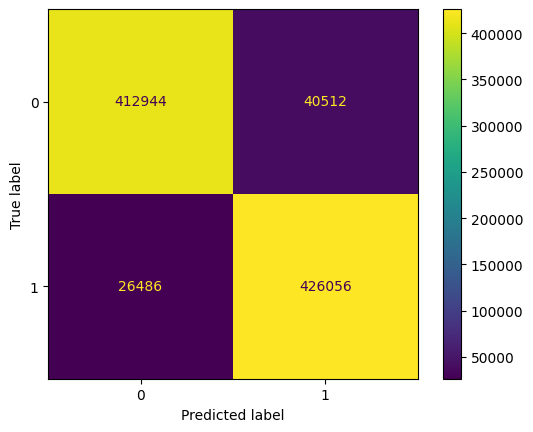

Accuracy:  0.9260506093832437


In [22]:
y_pred = model.predict(x_testcpy)
cm = confusion_matrix(y_testcpy, y_pred, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()
plt.show()
print("Accuracy: ", accuracy_score(y_testcpy, y_pred))

In [23]:
print(y_pred)
tree_pred = y_pred

[1 1 1 ... 0 1 1]


RANDOM FOREST

In [24]:
x_traincpy = np.copy(x_train)
y_traincpy = np.copy(y_train)
x_testcpy = np.copy(x_test)
y_testcpy = np.copy(y_test)

In [25]:


random = RandomForestClassifier(n_estimators = 10, criterion = 'entropy')
random_cross = fit_and_evaluate(random, x_traincpy , x_testcpy , y_traincpy , y_testcpy)

print('Random Forest Performance on the test set: Cross Validation Score = %0.4f' % random_cross)

Random Forest Performance on the test set: Cross Validation Score = 0.9672


In [58]:
import pickle

def save_model_to_pkl2(file_path):
    with open(file_path, 'wb') as file:
        pickle.dump(random.predict, file)

save_model_to_pkl('random_forest.pkl')

In [59]:
# random_forest_model = load_model_from_pkl('random_forest.pkl')
# result = random_forest_model(x_testcpy)
# print(result)

28313/28313 [==============================] - 153s 5ms/step
[[0.9952253 ]
 [0.7691611 ]
 [0.7691184 ]
 ...
 [0.02825625]
 [0.9959554 ]
 [0.99329275]]


In [26]:
y_pred = random.predict(x_testcpy)
print("Accuracy: ", accuracy_score(y_testcpy, y_pred))

Accuracy:  0.9664933035172263


In [27]:
print(y_pred)
randmom_pred = y_pred

[1 1 1 ... 0 1 1]


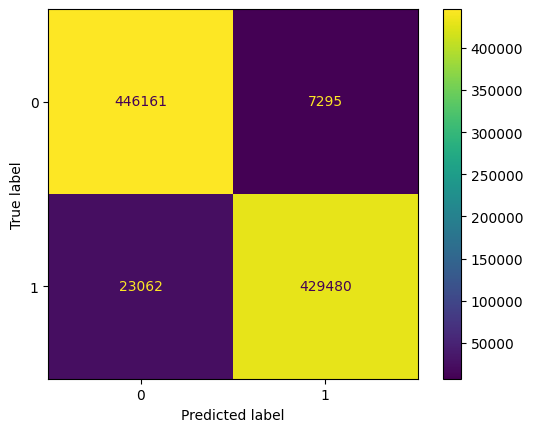

In [28]:
cm = confusion_matrix(y_testcpy, y_pred, labels=random.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=random.classes_)
disp.plot()
plt.show()

RNN

In [29]:
x_train_srnn = np.copy(x_train)
x_test_srnn = np.copy(x_test)
y_train_srnn = np.copy(y_train)
y_test_srnn = np.copy(y_test)

In [30]:
model = Sequential()
model.add(SimpleRNN(units=64, input_shape=(x_train_srnn.shape[1], 1), return_sequences=True))
model.add(SimpleRNN(units=64, return_sequences=True))
model.add(SimpleRNN(units=64, return_sequences=False))
model.add(Dense(units=1, activation='sigmoid'))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 36, 64)            4224      
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 36, 64)            8256      
                                                                 
 simple_rnn_2 (SimpleRNN)    (None, 64)                8256      
                                                                 
 dense (Dense)               (None, 1)                 65        
                                                                 
Total params: 20801 (81.25 KB)
Trainable params: 20801 (81.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [32]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

Epoch 1/3


28313/28313 [==============================] - 823s 29ms/step - loss: 0.1524 - accuracy: 0.9514 - val_loss: 0.1453 - val_accuracy: 0.9562
Epoch 2/3
28313/28313 [==============================] - 810s 29ms/step - loss: 0.1742 - accuracy: 0.9421 - val_loss: 0.2108 - val_accuracy: 0.8790
Epoch 3/3
28313/28313 [==============================] - 703s 25ms/step - loss: 0.1979 - accuracy: 0.9298 - val_loss: 0.2218 - val_accuracy: 0.9159


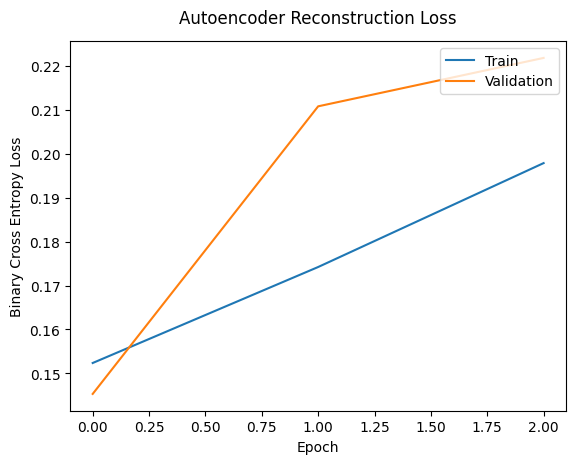

In [33]:
history = model.fit(x_train_srnn.reshape((x_train_srnn.shape[0], x_train_srnn.shape[1], 1)), y_train_srnn, epochs=3, batch_size=128,
                    validation_data=(x_test_srnn.reshape((x_test_srnn.shape[0], x_test_srnn.shape[1], 1)), y_test_srnn))
import matplotlib.pyplot as plt
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.ylabel('Binary Cross Entropy Loss')
plt.xlabel('Epoch')
plt.title('Autoencoder Reconstruction Loss', pad=13)
plt.legend(loc='upper right')

In [45]:
srnn_y_pred = model.predict(x_test_srnn.reshape((x_test_srnn.shape[0], x_test_srnn.shape[1], 1)))


28313/28313 [==============================] - 149s 5ms/step
Accuracy: 0.9158750902319873


In [ ]:
srnn_y_pred = (srnn_y_pred > 0.5).astype(int)

print("Accuracy:", accuracy_score(y_test_srnn, srnn_y_pred))

In [80]:
model.save('simple_rnn_model.h5')

In [81]:
from tensorflow.keras.models import load_model

loaded_model = load_model('simple_rnn_model.h5')


In [82]:
res = loaded_model(x_test_srnn.reshape((x_test_srnn.shape[0], x_test_srnn.shape[1], 1)))
print(res)

In [46]:
print(len(tree_pred))
print(tree_pred)

905998
[1 1 1 ... 0 1 1]


In [48]:
print(len(srnn_y_pred))
print(srnn_y_pred)

905998
[array([1]), array([1]), array([1]), array([0]), array([0]), array([0]), array([1]), array([0]), array([0]), array([0]), array([0]), array([1]), array([0]), array([1]), array([0]), array([1]), array([1]), array([0]), array([1]), array([1]), array([1]), array([0]), array([0]), array([0]), array([1]), array([1]), array([1]), array([1]), array([0]), array([1]), array([1]), array([0]), array([1]), array([0]), array([0]), array([1]), array([1]), array([0]), array([1]), array([1]), array([0]), array([0]), array([1]), array([1]), array([1]), array([0]), array([1]), array([0]), array([0]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1]), array([0]), array([0]), array([1]), array([0]), array([0]), array([0]), array([1]), array([1]), array([1]), array([1]), array([0]), array([0]), array([0]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1]), array([1]), array([0]), array([0]), array([1]), array([1]), array([0]), array([1]), array([0]), array([0

In [72]:
def ensemble_result(x_test):
    threshold = 0.5
    loaded_model_logi = load_model_from_pkl('logi_reg.pkl')
    loaded_model_rf = load_model_from_pkl('random_forest.pkl')
    loaded_model_srnn = 
    ensemble = []
    for i in range (len(x_test)):
        ensemble_pred = (loaded_model_logi[i] + loaded_model_rf[i] + loaded_model_srnn[i]) / 3
        ensemble.append(ensemble_pred)

    ensemble_accuracy = accuracy_score(y_test, ensemble_pred)
    print("Ensemble Accuracy: ", ensemble_accuracy)
    if ensemble_pred < threshold:
        return 0
    else:
        return 1

In [75]:
def save_model_to_pkl(file_path):
    with open(file_path, 'wb') as file:
        pickle.dump(ensemble_result, file)

def load_model_from_pkl(file_path):
    with open(file_path, 'rb') as file:
        return pickle.load(file)

save_model_to_pkl('ensemble.pkl')